In [1]:
# import libs

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly as py
import plotly.express as px

In [3]:
data = pd.read_csv(r"AB_NYC_2019.csv")
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [5]:
data.shape

(48895, 16)

## Dataset Info

####  Context
Since 2008, guests and hosts have used Airbnb to expand on traveling possibilities and present more unique, personalized way of experiencing the world. This dataset describes the listing activity and metrics in NYC, NY for 2019.

#### Content
This data file includes all needed information to find out more about hosts, geographical availability, necessary metrics to make predictions and draw conclusions.

The dataset consists of 48,895 properties and 16 features.


Pricing KPIs
1. Average price per property
2. Median price per room type 
3. Price distribution by neighbourhood
4. Price per review ratio 

### Pricing strategies 

1. value-based
2. competition-based
3. cost-plus
4. dynamic pricing 


In [6]:
# add some more detail on pricing strategy

## Data Pre-processing

- any missing values 
- any duplicates 
- correct data types 


In [5]:
def check_data(df):
    summary = [
        [col, df[col].dtype, df[col].count(), df[col].nunique(), df[col].isnull().sum(), (df[col].isnull().sum()/df[col].count()*100), df.duplicated().sum()]
        for col in df.columns] 
        
        
    df_check = pd.DataFrame(summary, columns = ['Column', 'Dtype', 'Instances', 'Unique', 'Missing_vals', 'Missing_vals_%', 'Duplicates'])
    pd.set_option('display.max_rows', None),
    pd.set_option('display.max_columns', None),
    pd.set_option('display.precision', 2)
        
    return df_check
        
        


In [6]:
check_data(data)

,Column,Dtype,Instances,Unique,Missing_vals,Missing_vals_%,Duplicates
0,id,int64,48895,48895,0,0.00,0
1,name,object,48879,47905,16,0.03,0
2,host_id,int64,48895,37457,0,0.00,0
3,host_name,object,48874,11452,21,0.04,0
4,neighbourhood_group,object,48895,5,0,0.00,0
5,neighbourhood,object,48895,221,0,0.00,0
6,latitude,float64,48895,19048,0,0.00,0
7,longitude,float64,48895,14718,0,0.00,0
8,room_type,object,48895,3,0,0.00,0
9,price,int64,48895,674,0,0.00,0


In [7]:
# It seems the reviews columns have 25% missing values. Let's take a closer look at these columns. 


In [8]:
data['last_review'].head()

0    2018-10-19
1    2019-05-21
2           NaN
3    2019-07-05
4    2018-11-19
Name: last_review, dtype: object

In [9]:
#The last review column is the date of the most recent review for the listing. 

In [10]:
data['reviews_per_month'].head()

0    0.21
1    0.38
2     NaN
3    4.64
4    0.10
Name: reviews_per_month, dtype: float64

In [11]:
# we can split the date columns in to day of the week, month and year for further analysis. 

In [12]:
null_revs = (data['number_of_reviews']==0).sum()
print(null_revs)

10052


 We can deduce that the null values in the last review column are due to the lack of any reviews made. For now we will retain these rows as they may be relevant in further analysis. 

In [13]:
data['name'].head()

0                  Clean & quiet apt home by the park
1                               Skylit Midtown Castle
2                 THE VILLAGE OF HARLEM....NEW YORK !
3                     Cozy Entire Floor of Brownstone
4    Entire Apt: Spacious Studio/Loft by central park
Name: name, dtype: object

In [14]:
data['host_name'].head()

0           John
1       Jennifer
2      Elisabeth
3    LisaRoxanne
4          Laura
Name: host_name, dtype: object

Given that there are few rows (i.e. less than 25) missing from the name and host_name columns, let's drop them. Also, let's fill the missing values in the reviews column with a palceholder as the data is relevant.


In [15]:
# fill NaN with 0.00 
data['reviews_per_month'] = data['reviews_per_month'].fillna(0.00) 

In [16]:
# drop rows in name and host name columns

data = data.dropna(subset = ['name', 'host_name'])
data.shape

(48858, 16)

In [17]:
data.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [18]:
#let's change the last review column to date data type

data['last_review'] = pd.to_datetime(data['last_review'], errors='coerce')
                                     #format = '%d%m%y')

In [19]:
# availability - number of days when listing is available for booking

In [20]:
data['last_review']

0       2018-10-19
1       2019-05-21
2              NaT
3       2019-07-05
4       2018-11-19
5       2019-06-22
6       2017-10-05
7       2019-06-24
8       2017-07-21
9       2019-06-09
10      2019-06-22
11      2019-06-23
12      2019-06-24
13      2019-07-05
14      2018-10-31
15      2019-06-29
16      2019-06-28
17      2019-07-01
18      2019-06-22
19             NaT
20      2011-12-28
21      2019-07-01
22      2019-01-01
23      2019-07-02
24      2019-06-19
25      2019-06-23
26             NaT
27      2017-08-13
28      2019-06-15
29      2019-04-19
30      2019-06-01
31      2019-06-14
32      2019-06-15
33      2019-07-01
34      2019-05-12
35      2019-06-21
36             NaT
37      2019-06-22
38             NaT
39      2019-07-05
40      2019-06-21
41      2019-05-27
42      2018-09-30
43      2019-06-16
44      2019-06-13
45      2019-06-05
46      2019-07-01
47      2019-05-25
48      2017-01-01
49      2019-06-17
50      2019-06-16
51      2019-07-07
52      2019

In [21]:
data['reviews_per_month']

0         0.21
1         0.38
2         0.00
3         4.64
4         0.10
5         0.59
6         0.40
7         3.47
8         0.99
9         1.33
10        0.43
11        1.50
12        1.34
13        0.91
14        0.22
15        1.20
16        1.72
17        2.12
18        4.44
19        0.00
20        0.07
21        1.09
22        0.37
23        0.61
24        0.73
25        1.37
26        0.00
27        0.49
28        1.11
29        0.24
30        2.04
31        1.42
32        1.65
33        2.37
34        0.66
35        1.41
36        0.00
37        1.96
38        0.00
39        1.81
40        2.08
41        0.39
42        0.23
43        0.69
44        0.84
45        0.49
46        2.25
47        0.52
48        0.10
49        1.16
50        1.01
51        0.63
52        0.70
53        2.82
54        0.22
55        0.90
56        0.17
57        2.49
58        1.19
59        0.30
60        0.38
61        0.12
62        0.57
63        1.33
64        0.23
65        1.65
66        

## EDA 

### Pricing KPI's

In [22]:
# price distribution
data['price'].describe()

count    48858.00
mean       152.74
std        240.23
min          0.00
25%         69.00
50%        106.00
75%        175.00
max      10000.00
Name: price, dtype: float64

In [23]:
mean_price = data['price'].mean()
median_price = data['price'].median()

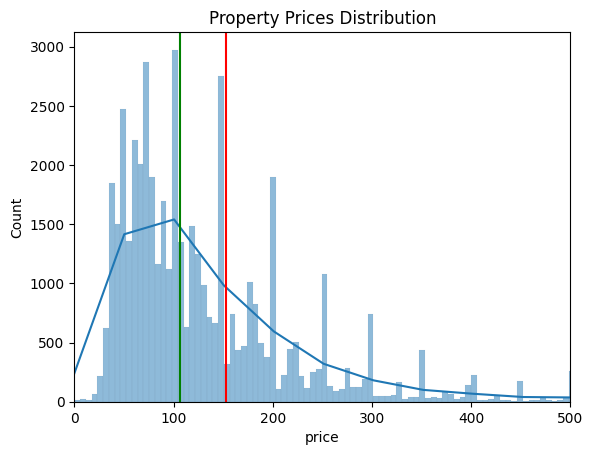

In [26]:
sns.histplot(data['price'], kde=True)
plt.axvline(x=mean_price, color='r', linestyle = '-')
plt.axvline(x=median_price, color='g', linestyle ='-')
plt.xlim(0,500)
plt.title('Property Prices Distribution')
plt.show()

In [25]:
# are there any prices less than zero??

data['price'].min()

0

Most properties are priced close to the median value, followed by the mean value. The mean value is greater than the median. Therefore, the price distribution is positively skewed and there are more prices towards the lower end of the range. This is reinforced by the long tail shown to the righ of the mean price.

In [27]:
data.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [35]:
# Average price per property 

data.groupby('name')['price'].mean().sort_values(ascending=False)

name
1-BR Lincoln Center                                                                                                                                                                    10000.00
Luxury 1 bedroom apt. -stunning Manhattan views                                                                                                                                        10000.00
Furnished room in Astoria apartment                                                                                                                                                    10000.00
Quiet, Clean, Lit @ LES & Chinatown                                                                                                                                                     9999.00
Spanish Harlem Apt                                                                                                                                                                      9999.00
2br - The Heart of NYC: Manhattans 

In [36]:
# Average price per room type

data.groupby('room_type')['price'].mean().sort_values(ascending=False)

room_type
Entire home/apt    211.81
Private room        89.79
Shared room         70.08
Name: price, dtype: float64

In [34]:
# prices by neighborhood? 

data.groupby('neighbourhood')['price'].mean().sort_values(ascending=False)


neighbourhood
Fort Wadsworth                800.00
Woodrow                       700.00
Tribeca                       490.64
Sea Gate                      487.86
Riverdale                     442.09
Prince's Bay                  409.50
Battery Park City             367.09
Flatiron District             341.93
Randall Manor                 336.00
NoHo                          295.72
SoHo                          287.10
Midtown                       282.72
Neponsit                      274.67
West Village                  267.68
Greenwich Village             263.50
Chelsea                       249.77
Willowbrook                   249.00
Theater District              248.01
Nolita                        230.20
Financial District            225.49
Gramercy                      222.75
Little Italy                  222.07
Murray Hill                   220.96
Breezy Point                  213.33
Cobble Hill                   211.93
Upper West Side               210.99
Brooklyn Heights        

In [49]:
data['number_of_reviews'].dropna()

0          9
1         45
2          0
3        270
4          9
5         74
6         49
7        430
8        118
9        160
10        53
11       188
12       167
13       113
14        27
15       148
16       198
17       260
18        53
19         0
20         9
21       130
22        39
23        71
24        88
25        19
26         0
27        58
28       108
29        29
30       242
31        88
32       197
33       273
34        74
35       168
36         0
37       231
38         0
39       214
40       245
41        15
42        25
43        81
44        97
45        11
46       248
47        61
48        11
49       135
50       112
51        73
52        82
53       328
54        19
55       105
56        19
57       289
58       138
59        21
60        42
61         5
62        66
63       143
64        27
65       191
66         4
67       338
68       148
69       106
70       190
71        49
72        23
73        49
74       105
75        21
76       142

In [51]:
# price per review ratio 

price_per_rev = data['price']/data['number_of_reviews']
price_per_rev = price_per_rev.dropna()

In [46]:
price_per_rev

0          16.56
1           5.00
2            inf
3           0.33
4           8.89
5           2.70
6           1.22
7           0.18
8           0.67
9           0.94
10          2.55
11          0.45
12          0.53
13          0.75
14          4.44
15          0.95
16          1.09
17          0.54
18          1.87
19           inf
20         33.22
21          1.00
22          2.05
23          1.55
24          1.36
25          3.16
26           inf
27          2.59
28          0.41
29          6.21
30          0.21
31          0.59
32          0.28
33          0.18
34          0.95
35          0.53
36           inf
37          0.37
38           inf
39          0.19
40          0.28
41          8.00
42          4.80
43          1.67
44          1.55
45         13.64
46          0.52
47          1.80
48         10.45
49          0.59
50          0.71
51          2.07
52          2.78
53          0.44
54         10.53
55          1.43
56          5.79
57          0.24
58          0.

### Occupancy and Availability KPI's

<Axes: xlabel='availability_365', ylabel='Count'>

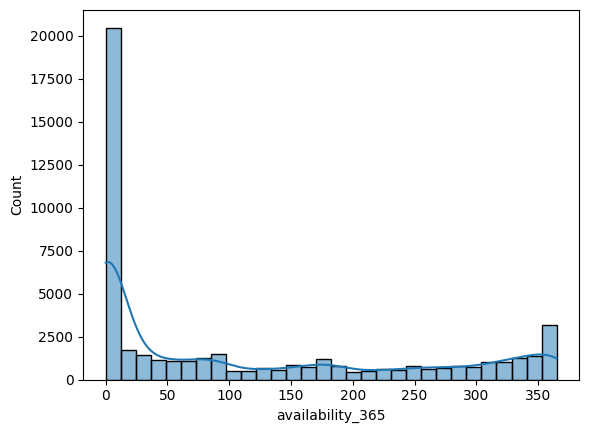

In [53]:
# occupancy proxy

sns.histplot(data['availability_365'], kde=True)

In [55]:
data['availability_365'].describe()

count    48858.00
mean       112.80
std        131.61
min          0.00
25%          0.00
50%         45.00
75%        227.00
max        365.00
Name: availability_365, dtype: float64

In [ ]:
# booking trends by minimum 